## Preprocessing data for machine learning

The photos contains cats in many situations and backgrounds. To make it easier to do machine learning, we will *preprocess* the data, so the photos only contains the face of the cat. Preprocessing is and important step in most machine learning approaches.

The preprocessing steps are:

- Define a model cat (`ModelCat.jpg`) with associated landmarks (`ModelCat.jpg.cat`)
- For each cat in the training data:
  - Use landmark based registration with a *similarity transform* to register the photo to the model cat
  - Crop the registered photo
  - Save the result in a fold called **preprocessed**

**Exercise 1:** *Preprocess all image in the training set. To do the preprocessing, you can use the code snippets supplied* [here](https://github.com/RasmusRPaulsen/DTUImageAnalysis/tree/main/exercises/ex8-CatsCatsCats/data). There is also a **Model Cat** supplied.

The result of the preprocessing is a directory containing smaller photos containing cat faces. All the preprocessed photos also have the same size. 

In [1]:
from skimage import io
from skimage.util import img_as_ubyte
import matplotlib.pyplot as plt
import numpy as np
import glob
from sklearn.decomposition import PCA
from skimage.transform import SimilarityTransform
from skimage.transform import warp
import os
import pathlib

In [2]:
def read_landmark_file(file_name):
    f = open(file_name, 'r')
    lm_s = f.readline().strip().split(' ')
    n_lms = int(lm_s[0])
    if n_lms < 3:
        print(f"Not enough landmarks found")
        return None

    new_lms = 3
    # 3 landmarks each with (x,y)
    lm = np.zeros((new_lms, 2))
    for i in range(new_lms):
        lm[i, 0] = lm_s[1 + i * 2]
        lm[i, 1] = lm_s[2 + i * 2]
    return lm
def align_and_crop_one_cat_to_destination_cat(img_src, lm_src, img_dst, lm_dst):
    """
    Landmark based alignment of one cat image to a destination
    :param img_src: Image of source cat
    :param lm_src: Landmarks for source cat
    :param lm_dst: Landmarks for destination cat
    :return: Warped and cropped source image. None if something did not work
    """
    tform = SimilarityTransform()
    tform.estimate(lm_src, lm_dst)
    warped = warp(img_src, tform.inverse, output_shape=img_dst.shape)

    # Center of crop region
    cy = 185
    cx = 210
    # half the size of the crop box
    sz = 180
    warp_crop = warped[cy - sz:cy + sz, cx - sz:cx + sz]
    shape = warp_crop.shape
    if shape[0] == sz * 2 and shape[1] == sz * 2:
        return img_as_ubyte(warp_crop)
    else:
        print(f"Could not crop image. It has shape {shape}. Probably to close to border of image")
        return None
def create_u_byte_image_from_vector(im_vec, height, width, channels):
    min_val = im_vec.min()
    max_val = im_vec.max()

    # Transform to [0, 1]
    im_vec = np.subtract(im_vec, min_val)
    im_vec = np.divide(im_vec, max_val - min_val)
    im_vec = im_vec.reshape(height, width, channels)
    im_out = img_as_ubyte(im_vec)
    return im_out
def preprocess_all_cats(in_dir, out_dir):
    """
    Create aligned and cropped version of image
    :param in_dir: Where are the original photos and landmark files
    :param out_dir: Where should the preprocessed files be placed
    """
    dst = "data/ModelCat"
    dst_lm = read_landmark_file(f"{dst}.jpg.cat")
    dst_img = io.imread(f"{dst}.jpg")

    all_images = glob.glob(in_dir + "*.jpg")
    for img_idx in all_images:
        name_no_ext = os.path.splitext(img_idx)[0]
        base_name = os.path.basename(name_no_ext)
        out_name = f"{out_dir}/{base_name}_preprocessed.jpg"

        src_lm = read_landmark_file(f"{name_no_ext}.jpg.cat")
        src_img = io.imread(f"{name_no_ext}.jpg")

        proc_img = align_and_crop_one_cat_to_destination_cat(src_img, src_lm, dst_img, dst_lm)
        if proc_img is not None:
            io.imsave(out_name, proc_img)
def preprocess_one_cat():
    src = "data/MissingCat"
    dst = "data/ModelCat"
    out = "data/MissingCatProcessed.jpg"

    src_lm = read_landmark_file(f"{src}.jpg.cat")
    dst_lm = read_landmark_file(f"{dst}.jpg.cat")

    src_img = io.imread(f"{src}.jpg")
    dst_img = io.imread(f"{dst}.jpg")

    src_proc = align_and_crop_one_cat_to_destination_cat(src_img, src_lm, dst_img, dst_lm)
    if src_proc is None:
        return

    io.imsave(out, src_proc)

    fig, ax = plt.subplots(ncols=3, figsize=(16, 6))
    ax[0].imshow(src_img)
    ax[0].plot(src_lm[:, 0], src_lm[:, 1], '.r', markersize=12)
    ax[1].imshow(dst_img)
    ax[1].plot(dst_lm[:, 0], dst_lm[:, 1], '.r', markersize=12)
    ax[2].imshow(src_proc)
    for a in ax:
        a.axis('off')
    plt.tight_layout()
    plt.show()

In [3]:
raw_dir = "data/training_data_small/"
preprocess_dir = "data/preprocessed_data_small/"
preprocess_all_cats(raw_dir, preprocess_dir)

## Gathering data into a data matrix

To start, we want to collect all the image data into a data matrix. The matrix should have dimensions `[n_samples, n_features]` where **n_samples** is the number of photos in our training set and **n_features** is the number of values per image. Since we are working with RGB images, the number of features are given by `n_features = height * width * channels`, where `channels = 3`. 

The data matrix can be constructed by:

- Find the number of image files in the **preprocessed** folder using [`glob`](https://docs.python.org/3/library/glob.html). Look at the `preprocess_all_cats` function to get an idea of how to use `glob`. 
- Read the first photo and use that to find the height and width of the photos
- Set **n_samples** and **n_features**
- Make an empty matrix `data_matrix = np.zeros((n_samples, n_features))`
- Read the image files one by one and use `flatten()` to make each image into a 1-D vector (flat_img). 
- Put the image vector (flat_img) into the data matrix by for example `data_matrix[idx, :] = flat_img` , where idx is the index of the current image.

**Exercise 2:** *Compute the data matrix.* 

In [4]:
files = glob.glob(f"{preprocess_dir}/*.jpg")

height, width, channels = io.imread(files[0]).shape
data_matrix = np.zeros((len(files), height * width * channels))
for i, f in enumerate(files):
    data_matrix[i, :] = io.imread(f).flatten()

## Compute and visualize a mean cat

In the data matrix, one row is one cat. You can therefore compute an average cat, **The Mean Cat** by computing one row, where each element is the average of the column. 
**Exercise 3:** *Compute the average cat.* 

In [5]:
mean_cat = np.mean(data_matrix, axis=0)
mean_cat.shape


(388800,)

You can use the supplied function `create_u_byte_image_from_vector` to create an image from a 1-D image vector.

**Exercise 4:** *Visualize the Mean Cat* 


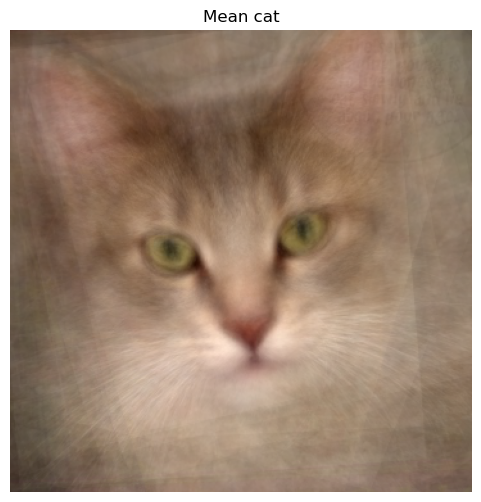

In [6]:
visualize_mean_cat = create_u_byte_image_from_vector(mean_cat, height, width, channels)
fig, ax = plt.subplots(1, 1, figsize=(6, 6))
plt.imshow(visualize_mean_cat)
ax.set_title("Mean cat")
ax.set_axis_off()
plt.show()

## Find a missing cat or a cat that looks like it (using image comparison)

You have promised to take care of your neighbours cat while they are on vacation. But...Oh! no! You were in such a hurry to get to DTU that you forgot to close a window. Now the cat is gone!!! What to do? 

**Exercise 5:** *Decide that you quickly buy a new cat that looks very much like the missing cat - so nobody notices*
Luckily, the training set is actually photos of cats that are in a *get a new cat cheap* nearby store. 

To find a cat that looks like the missing cat, you start by comparing the missing cat pixels to the pixels of the cats in the training set. The comparison between the missing cat data and the training data can be done using the sum-of-squared differences (SSD). 
**Exercise 6:** *Use the `preprocess_one_cat` function to preprocess the photo of the poor missing cat*

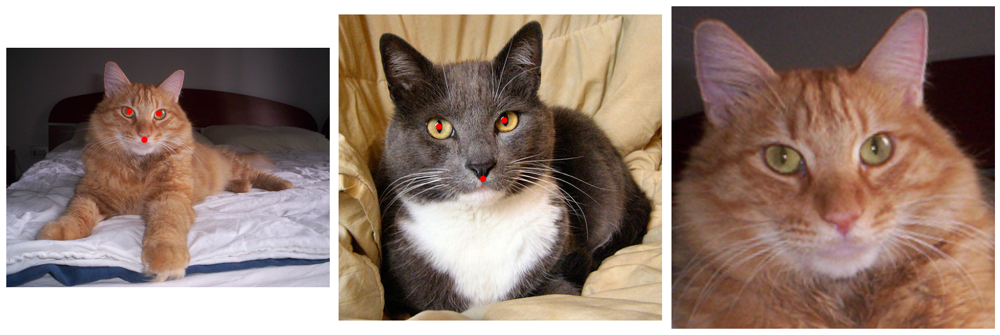

In [7]:
preprocess_one_cat()
# First image is the missing cat, second one the model cat 
# and the third one is the missing cat aligned and cropped
# Now there is a new file data/MissingCatProcessed.jpg

**Exercise 7:** *Flatten the pixel values of the missing cat so it becomes a vector of values.*

In [8]:
missing_cat =io.imread("data/MissingCatProcessed.jpg")
missing_cat = missing_cat.flatten()


**Exercise 8:** *Subtract you missing cat data from all the rows in the data_matrix and for each row compute the sum of squared differences. This can for example be done by:*

In [9]:
sub_data = data_matrix - missing_cat
sub_distances = np.linalg.norm(sub_data, axis=1)

**Exercise 9:** *Find the cat that looks most like your missing cat by finding the cat, where the SSD is smallest. You can for example use `np.argmin`.*

In [10]:
smallest_error = np.argmin(sub_distances)
smallest_error

32

**Exercise 10:** *Extract the found cat from the data_matrix and use `create_u_byte_image_from_vector` to create an image that can be visualized. Did you find a good replacement cat? Do you think your neighbour will notice? Even with their glasses on?*

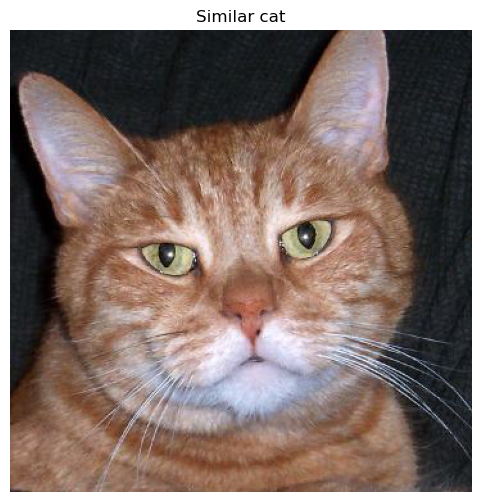

In [11]:
similar_cat = create_u_byte_image_from_vector(data_matrix[smallest_error, :], height, width, channels)

fig, ax = plt.subplots(1, 1, figsize=(6, 6))
plt.imshow(similar_cat)
ax.set_title("Similar cat")
ax.set_axis_off()
plt.show()

**Exercise 11:** *You can use `np.argmax` to find the cat that looks the least like the missing cat.*

You can also use your own photo of a cat (perhaps even your own cat). To do that you should:

- Place a jpg version of your cat photo in the folder where you had your missing cat photo. Call it for example **mycat.jpg**
- Create a landmark file called something like **mycat.jpg.cat**. It is a text file.
- In the landmark file you should create three landmarks: `3 189 98 235 101 213 142` . Here the first `3` just say there are three landmarks. The following 6 numbers are the (x, y) positions of the right eye, the left eye and the nose. You should manually update these numbers.
- Use the `preprocess_one_cat` function to preprocess the photo
- Now you can do the above routine to match your own cat.

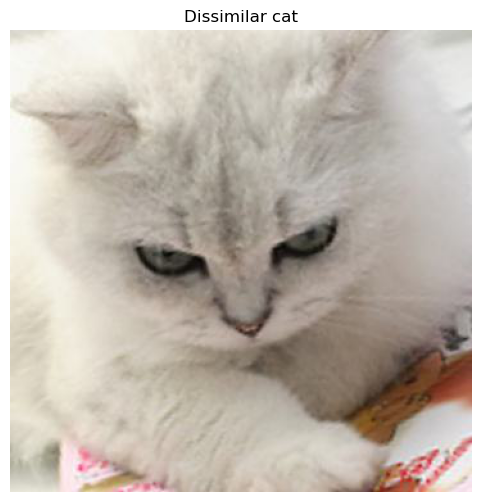

In [12]:
biggest_error= np.argmax(sub_distances)

wrong_cat = create_u_byte_image_from_vector(data_matrix[biggest_error, :], height, width, channels)

fig, ax = plt.subplots(1, 1, figsize=(6, 6))
plt.imshow(wrong_cat)
ax.set_title("Dissimilar cat")
ax.set_axis_off()
plt.show()

## Principal component analysis on the cats 

We now move to more classical machine learning on cats. Namely Principal component analysis  (PCA) analysis of the cats image.

To compute the PCA, we use the [sci-kit learn PCA](https://scikit-learn.org/stable/modules/generated/sklearn.decomposition.PCA.html). Note that this version of PCA automatically *centers* data. It means that it will subtract the average cat from all cats for you. **Exercise 12:** *Start by computing the first 50 principal components:*

In [13]:
print("Computing PCA")
cats_pca = PCA(n_components=50)
cats_pca.fit(data_matrix)

Computing PCA


PCA(n_components=50)

The amount of the total variation that each component explains can be found in `cats_pca.explained_variance_ratio_`. **Exercise 13:** *Plot the amount of the total variation explained by each component as function of the component number.*

In [14]:
variance_ratio = cats_pca.explained_variance_ratio_
sum_variance_ratio = variance_ratio.sum()
sum_variance_ratio

0.9274850340081279

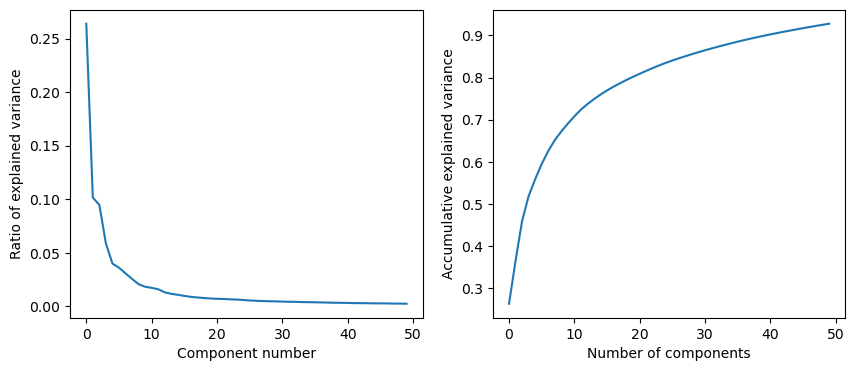

In [15]:
fig, ax = plt.subplots(1,2, figsize=(10,4))
ax[0].plot(variance_ratio)
ax[0].set_ylabel("Ratio of explained variance")
ax[0].set_xlabel("Component number")
ax[1].plot(variance_ratio.cumsum())
ax[1].set_ylabel("Accumulative explained variance")
ax[1].set_xlabel("Number of components")
plt.show()

**Exercise 14:** *How much of the total variation is explained by the first component?*

In [16]:
variance_ratio[0]*100

26.38454470771578

We can now project all out cat images into the PCA space (that is 50 dimensional):

**Exercise 15:** *Project the cat images into PCA space*:

In [17]:
components = cats_pca.transform(data_matrix)

Now each cat has a position in PCA space. For each cat this position is 50-dimensional vector. Each value in this vector describes *how much of that component* is present in that cat photo.

We can plot the first two dimensions of the PCA space, to see where the cats are placed. The first PCA coordinate for all the cats can be found using `pc_1 = components[:, 0]` .

**Exercise 16:** *Plot the PCA space by plotting all the cats first and second PCA coordinates in a (x, y) plot*

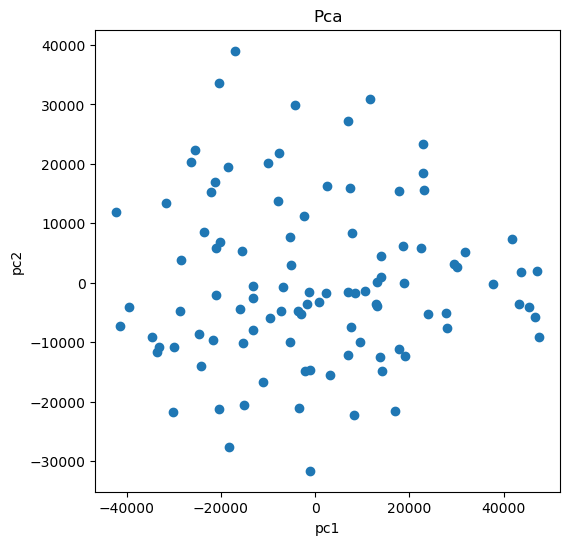

In [18]:
pc_1 = components[:, 0]
pc_2 = components[:, 1]
fig, ax = plt.subplots(1, 1, figsize=(6, 6))
ax.plot(pc_1, pc_2, 'o')
ax.set_ylabel("pc2")
ax.set_xlabel("pc1")
ax.set_title("Pca")
plt.show()


## Cats in space

We would like to explore what the PCA learnt about our cats in the data set. 

### Extreme cats

We start by finding out which cats that have the most *extreme coordinates* in PCA space. 

**Exercise 17:** *Use `np.argmin` and `np.argmax` to find the ids of the cats that have extreme values in the first and second PCA coordinates. Extract the cats data from the data matrix and use `create_u_byte_image_from_vector` to visualize these cats. Also plot the PCA space where you plot the extreme cats with another marker and color.*


In [19]:
def nargmax(arr, n):
    # Like np.argmax but returns the n largest values
    idx = np.argpartition(arr, -n)[-n:]
    return idx[np.argsort(arr[idx])][::-1]

def nargmin(arr, n):
    # Like np.argmin but returns the n smallest values
    idx = np.argpartition(arr, n)[:n]
    return idx[np.argsort(arr[idx])]

def plot_pca_space_and_img(pc_idx):
    _, ax = plt.subplots(1, 2, figsize=(6, 3))
    ax[0].plot(pc_1, pc_2, "o")
    ax[0].plot(pc_1[pc_idx], pc_2[pc_idx], "ro", markersize=10)
    ax[0].set_xlabel("PC1")
    ax[0].set_ylabel("PC2")
    
    img = create_u_byte_image_from_vector(data_matrix[pc_idx, :], height, width, channels)
    ax[1].imshow(img)
    ax[1].set_title("Cat")
    ax[1].set_axis_off()
    plt.show()

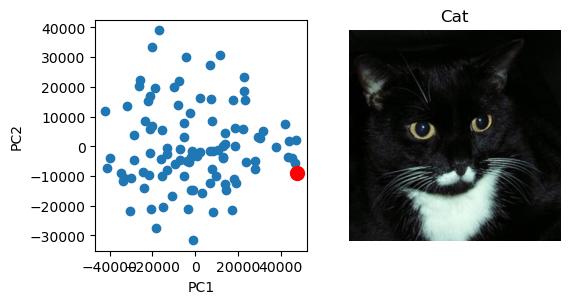

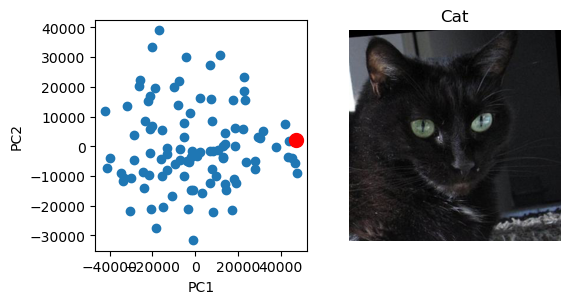

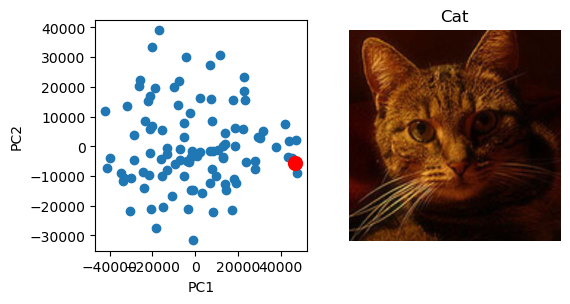

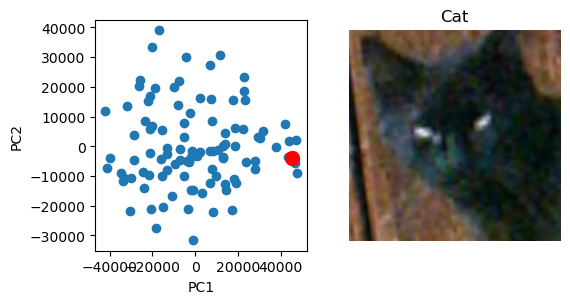

In [20]:
# Check the 4 largest values of PC1
max_pc1s = nargmax(pc_1, 4)
for i in max_pc1s:
    plot_pca_space_and_img(i)

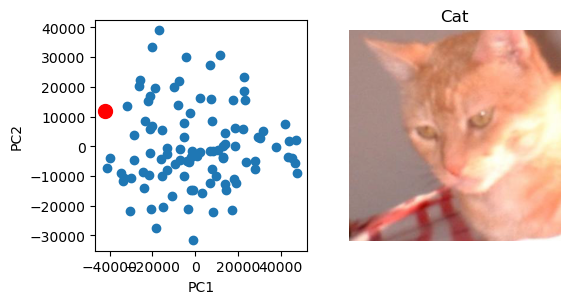

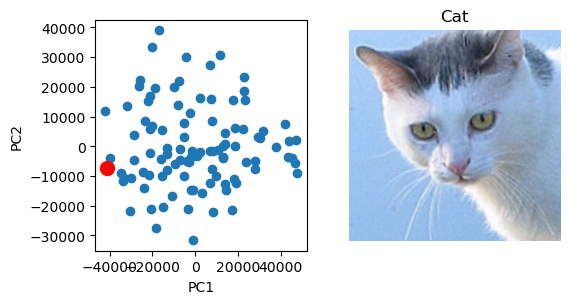

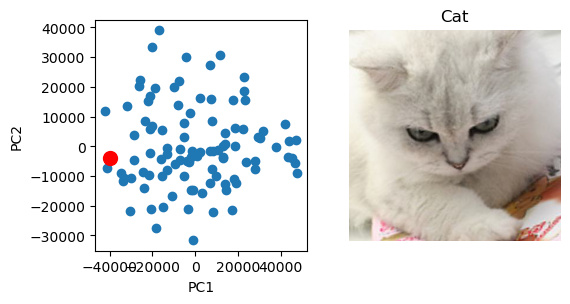

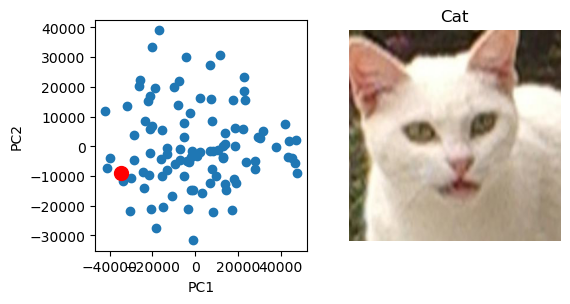

In [21]:
# Check the 4 smallest values of PC1
min_pc1s = nargmin(pc_1, 4)
for i in min_pc1s:
    plot_pca_space_and_img(i)

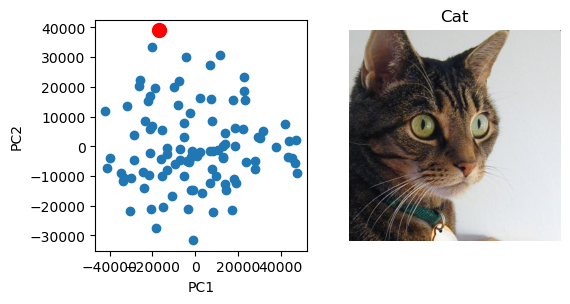

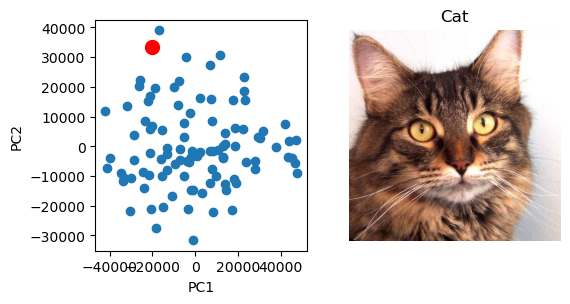

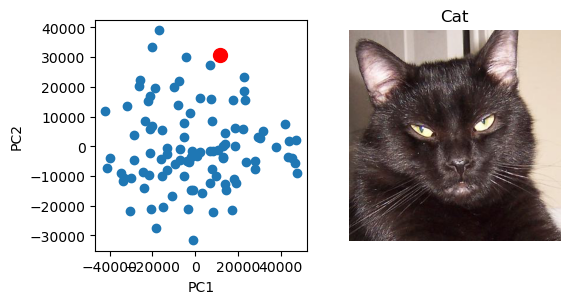

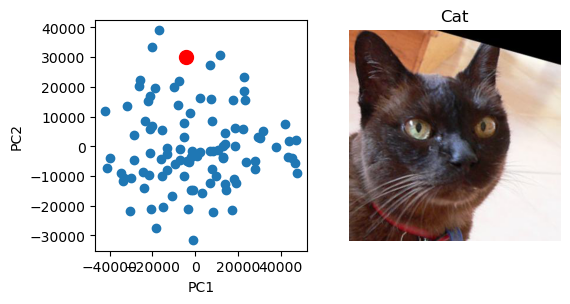

In [22]:
# Check the 4 largest values of PC2
max_pc2s = nargmax(pc_2, 4)
for i in max_pc2s:
    plot_pca_space_and_img(i)

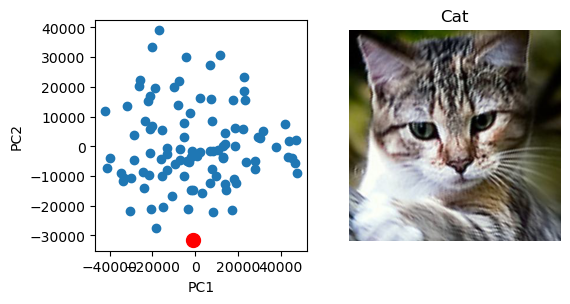

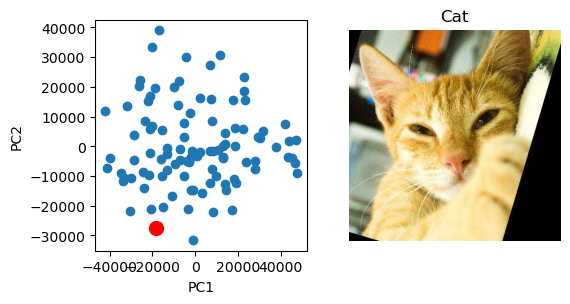

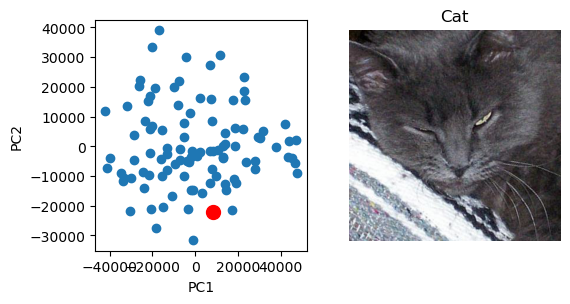

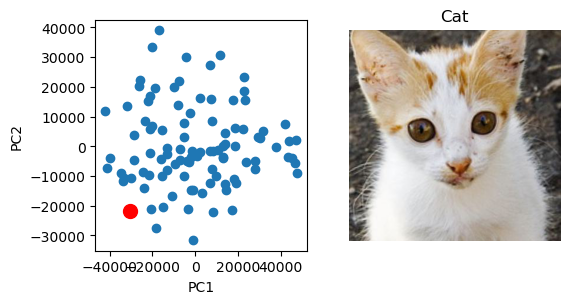

In [23]:
# Check the 4 smallest values of PC2
min_pc2s = nargmin(pc_2, 4)
for i in min_pc2s:
    plot_pca_space_and_img(i)

**Exercise 18:** *How do these extreme cat photo look like? Are some actually of such bad quality that they should be removed from the training set? If you remove images from the training set, then you should run the PCA again. Do this until you are satisfied with the quality of the training data.*

In [24]:
filtered_matrix = data_matrix.copy()

# Remove the 8 largest values of PC1, 5 smallest values of PC1,
# 5 largest values of PC2 and 5 smallest values of PC2
max_pc1s = nargmax(pc_1, 8)
min_pc1s = nargmin(pc_1, 5)
max_pc2s = nargmax(pc_2, 5)
min_pc2s = nargmin(pc_2, 5)

remove_idx = np.concatenate((max_pc1s, min_pc1s, max_pc2s, min_pc2s))
filtered_matrix = np.delete(filtered_matrix, remove_idx, axis=0)

# Recompute PCA
cats_pca = PCA(n_components=50)
cats_pca.fit(filtered_matrix)
components = cats_pca.transform(filtered_matrix)

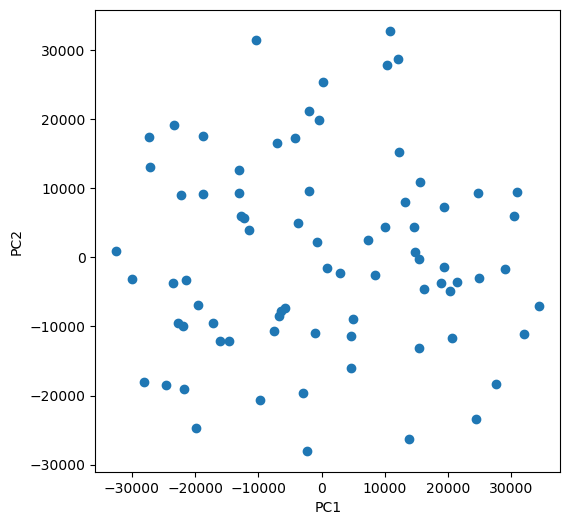

In [25]:
pc_1 = components[:, 0] 
pc_2 = components[:, 1]
fig, ax = plt.subplots(1, 1, figsize=(6, 6))
ax.plot(pc_1, pc_2, "o")
ax.set_xlabel("PC1")
ax.set_ylabel("PC2")
plt.show()

### The first synthesized cat

We can use the PCA to make a so-called **generative model** that can create synthetic samples from the learnt data. It is done by adding a linear combination of principal components to the average cat image:

$$
I_\text{synth} = I_\text{average} + w_1 * P_1 + w_2 * P_2 + \ldots + w_k * P_k \enspace ,
$$

where we $P_1$ is the first principal component, $P_2$ the second and so on. Here we use $k$ principal components.

The principal components are stored in `cats_pca.components_`. So the first principal component is `cats_pca.components_[0, :]` .

**Exercise 19:** *Create your first fake cat using the average image and the first principal component. You should choose experiment with different weight values (w)* :
```python
synth_cat = average_cat + w * cats_pca.components_[0, :]
```

In [26]:
print("Maximal value of PC1: {:.8f}".format(np.max(cats_pca.components_[0, :])))
print("Minimal value of PC1: {:.8f}".format(np.min(cats_pca.components_[0, :])))

Maximal value of PC1: 0.00044424
Minimal value of PC1: -0.00298314


In [27]:
w = 60000
synth_cat = mean_cat + cats_pca.components_[0, :] *w

**Exercise 20:** *Use `create_u_byte_image_from_vector` visualize your fake cat.*

You can use the PCA plot we did before to select some suitable values for w.

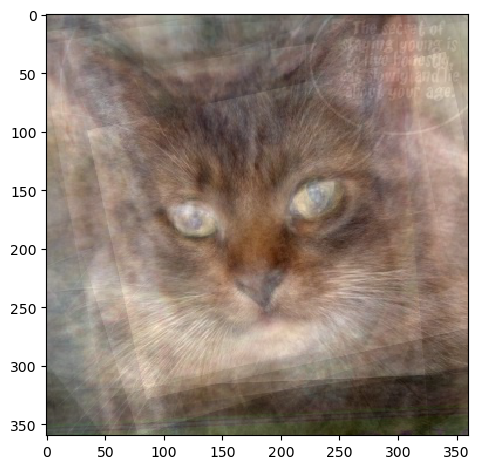

In [28]:
fake_cat = create_u_byte_image_from_vector(synth_cat, height, width, channels)
io.imshow(fake_cat)

**Exercise 21:** *Synthesize some cats, where you use both the first and second principal components and select their individual weights based on the PCA plot.*

In [29]:
print("Maximal value of PC2: {:.8f}".format(np.max(cats_pca.components_[1, :])))
print("Minimal value of PC2: {:.8f}".format(np.min(cats_pca.components_[1, :])))

Maximal value of PC2: 0.00431708
Minimal value of PC2: -0.00311088


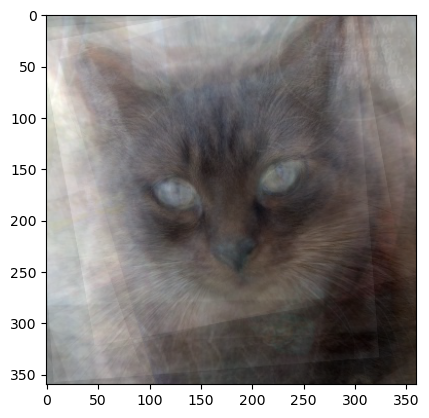

In [30]:
w = 60000
synth_cat = mean_cat + cats_pca.components_[0, :] *w + cats_pca.components_[1, :] *w
synth_cat_img = create_u_byte_image_from_vector(synth_cat, height, width, channels)
plt.imshow(synth_cat_img)
plt.show()

### The major cat variation in the data set

A very useful method to get an overview of the **major modes of variation** in a dataset is to synthesize the samples that are lying on the outer edges of the PCA space.

If we for example move a distance out of the first principal axis we can synthesize the cat image there. In this case we will try to move to $\pm \sqrt(\text{explained variance})$, where *explained variance* is the variance explained by that principal component. In code, this will look like:

here **m** is the principal component that we are investigating.


In [31]:
def visualize_mode_of_variation(m):
    synth_cat_plus = mean_cat + 3 * np.sqrt(cats_pca.explained_variance_[m]) * cats_pca.components_[m, :]
    synth_cat_minus = mean_cat - 3 * np.sqrt(cats_pca.explained_variance_[m]) * cats_pca.components_[m, :]
    
    fig, ax = plt.subplots(1, 3, figsize=(12, 4))
    ax[0].imshow(create_u_byte_image_from_vector(synth_cat_minus, height, width, channels))
    ax[0].set_title("Cat - 3$\sigma$")
    ax[1].imshow(create_u_byte_image_from_vector(mean_cat, height, width, channels))
    ax[1].set_title("Average cat")
    ax[2].imshow(create_u_byte_image_from_vector(synth_cat_plus, height, width, channels))
    ax[2].set_title("Cat + 3$\sigma$")
    fig.suptitle("Mode of variation PC{}".format(m + 1))

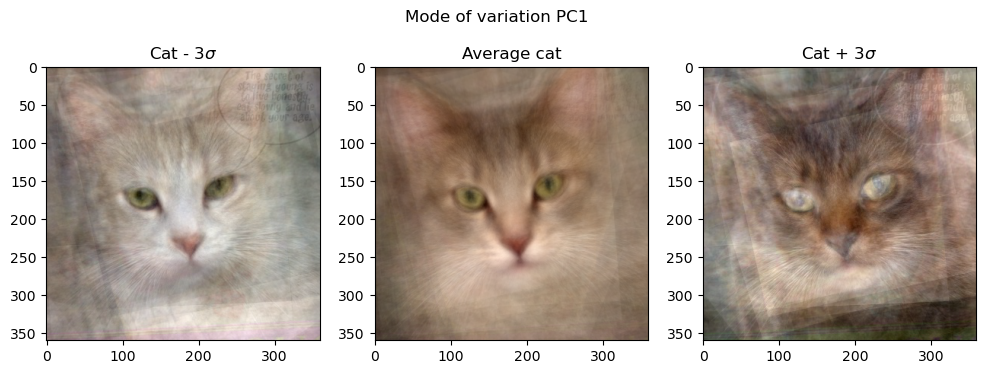

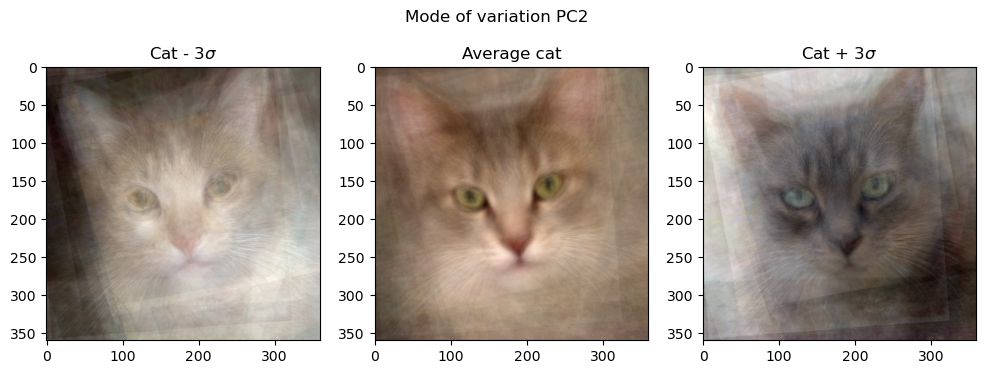

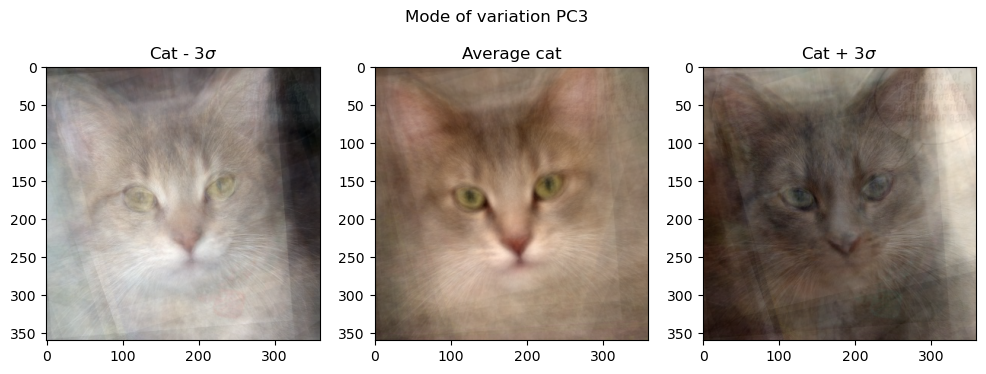

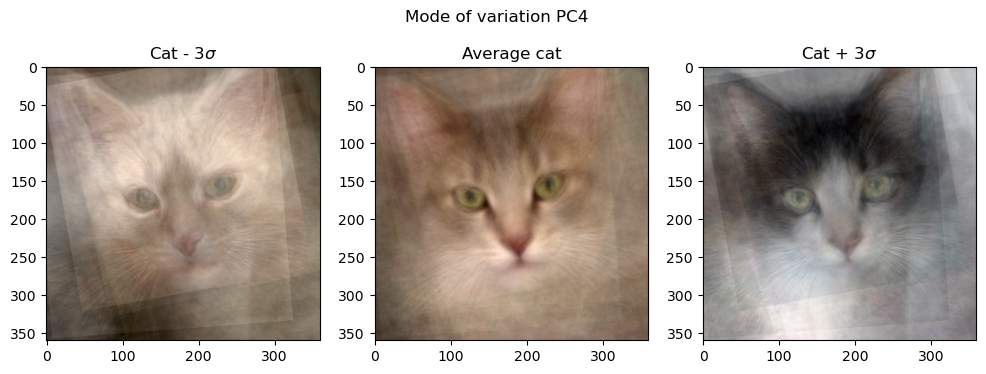

In [32]:
visualize_mode_of_variation(m = 0)
visualize_mode_of_variation(m = 1)
visualize_mode_of_variation(m = 2)
visualize_mode_of_variation(m = 3)

**Exercise 22:** *Synthesize and visualize cats that demonstrate the first three major modes of variation. Try show the average cat in the middle of a plot, with the negative sample to the left and the positive to the right. Can you recognise some visual patterns in these modes of variation?*

### The Cat Synthesizer (EigenCats)

We are now ready to make true cat synthesizer, where cat images are synthesized based on random locations in PCA space. You can start by setting your `synth_cat = average_cat`. Then you can add all the components you want by for example (this number should be less or equal to the number of components we asked the PCA to compute):

In [33]:
def random_cat_generator():
    w = np.random.randn(50)*50000
    w = w*np.exp(-np.arange(50)) # Decrease the influence of the higher PCs
    synth_cat = mean_cat + np.dot(w, cats_pca.components_)
    return create_u_byte_image_from_vector(synth_cat, height, width, channels)

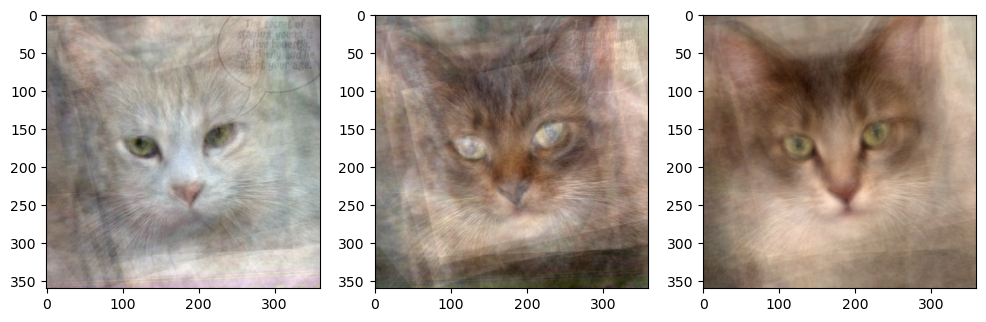

In [34]:
fig, ax = plt.subplots(1, 3, figsize=(12, 4))
ax[0].imshow(random_cat_generator())
ax[1].imshow(random_cat_generator())
ax[2].imshow(random_cat_generator())
plt.show()

**Exercise 23:** *Generate as many cat photos as your heart desires.*.

## Cat identification in PCA space

Now back to your missing cat. We could find similar cats by computing the difference between the missing cat and all the photos in the databased. Imagine that you only needed to store the 50 weights per cats in your database to do the same type of identification?

**Exercise 24:** *Start by finding the PCA space coordinates of your missing cat:*

In [35]:
im_miss = io.imread("data/MissingCatProcessed.jpg")
im_miss_flat = im_miss.flatten()
im_miss_flat = im_miss_flat.reshape(1, -1)
pca_coords = cats_pca.transform(im_miss_flat)
pca_coords = pca_coords.flatten()

The `flatten` calls are needed to bring the arrays into the right shapes.

**Exercise 25:** *Plot all the cats in PCA space using the first two dimensions. Plot your missing cat in the same plot, with another color and marker. Is it placed somewhere sensible and does it have close neighbours?*

We can generate the synthetic cat that is the closest to your missing cat, by using the missing cats position in PCA space:

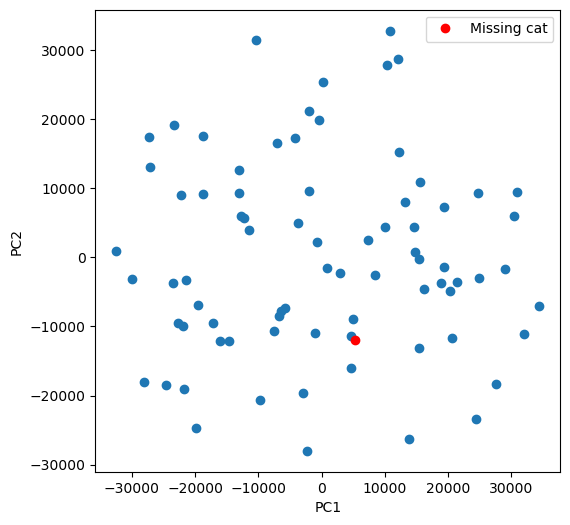

In [36]:
components = cats_pca.transform(filtered_matrix)
pc_1 = components[:, 0] 
pc_2 = components[:, 1]
fig, ax = plt.subplots(1, 1, figsize=(6, 6))
ax.plot(pc_1, pc_2, "o")
ax.plot(pca_coords[0], pca_coords[1], "ro", label="Missing cat")
ax.set_xlabel("PC1")
ax.set_ylabel("PC2")
plt.legend()
plt.show()

**Exercise 26:** *Generate synthetic versions of your cat, where you change the n_components_to_use from 1 to for example 50.*

We can compute Euclidean distances in PCA space between your cat and all the other cats by:

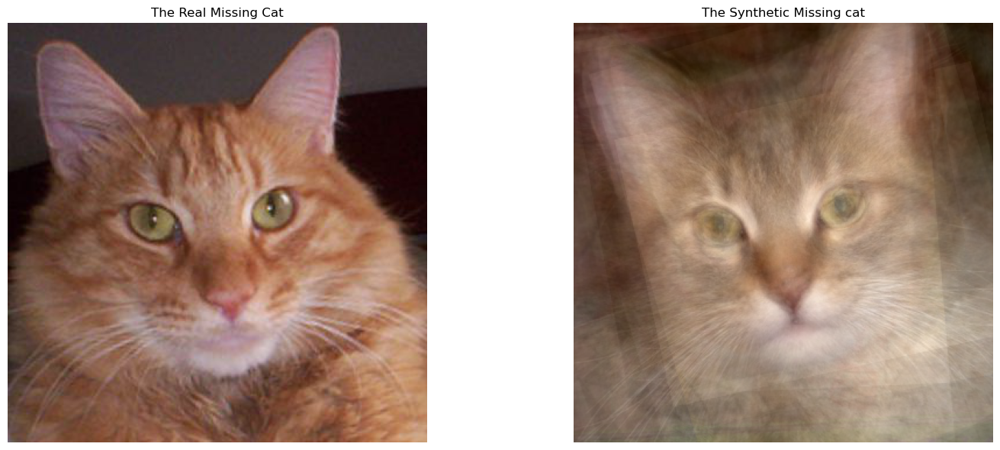

In [37]:
n_components_to_use = 10
synth_cat = mean_cat
for idx in range(n_components_to_use):
	synth_cat = synth_cat + pca_coords[idx] * cats_pca.components_[idx, :]

fig, ax = plt.subplots(ncols=2, figsize=(16, 6))
ax[0].imshow(im_miss)
ax[0].set_title('The Real Missing Cat')
ax[1].imshow(create_u_byte_image_from_vector(synth_cat, height, width, channels))
ax[1].set_title('The Synthetic Missing cat')
for a in ax:
	a.axis('off')
plt.tight_layout()
plt.show()

**Exercise 27:** *Find the id of the cat that has the smallest and largest distance in PCA space to your missing cat. Visualize these cats. Are they as you expected? Do you think your neighours will notice a difference?*

You can also find the n closest cats by using the `np.argpartition` function.

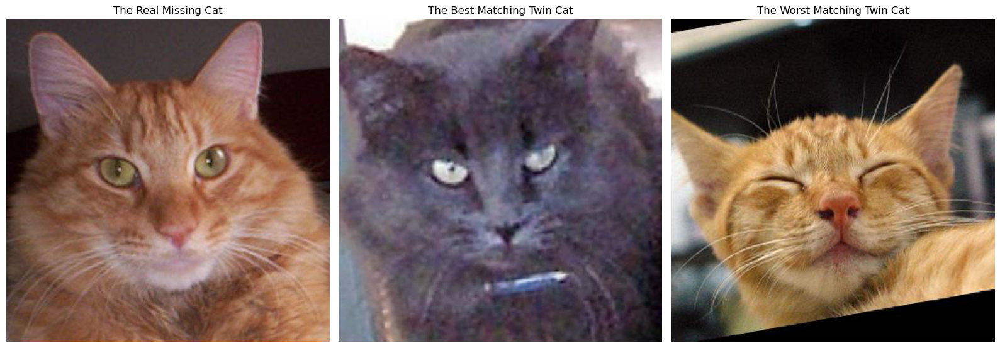

In [38]:
comp_sub = components - pca_coords
pca_distances = np.linalg.norm(comp_sub, axis=1)

best_match = np.argmin(pca_distances)
best_twin_cat = data_matrix[best_match, :]
worst_match = np.argmax(pca_distances)
worst_twin_cat = data_matrix[worst_match, :]
fig, ax = plt.subplots(ncols=3, figsize=(16, 6))
ax[0].imshow(im_miss)
ax[0].set_title('The Real Missing Cat')
ax[1].imshow(create_u_byte_image_from_vector(best_twin_cat, height, width, channels))
ax[1].set_title('The Best Matching Twin Cat')
ax[2].imshow(create_u_byte_image_from_vector(worst_twin_cat, height, width, channels))
ax[2].set_title('The Worst Matching Twin Cat')
for a in ax:
    a.axis('off')
plt.tight_layout()
plt.show()

**Exercise 28:** *Find the ids of and visualize the 5 closest cats in PCA space. Do they look like your cat?*

What we have been doing here is what has been used for face identification and face recognition (*Matthew Turk and Alex Pentland: Eigenfaces for Recognition, 1991*)

In summary, we can now synthesize all the cat photos you will only need and we can help people that are loooking for cats that looks like another cat. On top of that, we can now use methods that are considered state-of-the-art before the step into deep learning.

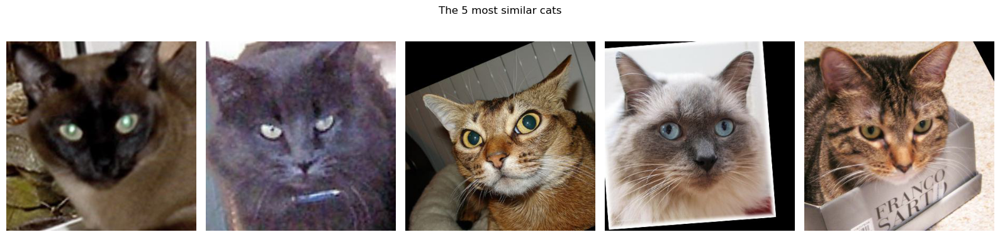

In [39]:
n_best = 5
best = np.argpartition(pca_distances, n_best)
fig, ax = plt.subplots(ncols=n_best, figsize=(16, 4))
for i in range(n_best):
    candidate_twin_cat = data_matrix[best[i], :]
    ax[i].imshow(create_u_byte_image_from_vector(candidate_twin_cat, height, width, channels))
    ax[i].axis('off')

fig.suptitle(f"The {n_best} most similar cats")
plt.tight_layout()
plt.show()